Using Transfer Learning and TensorFlow 2.0 to Classify the different sports in the picture
In this project we're going to be using machine learning to help us identify different sports.

This problem is a multi-class image classification.

We're going to go through the following TensorFlow/Deep Learning workflow:

Get data ready
Prepare the data (preprocessing, X & y).
Choose and fit/train a model (TensorFlow Hub, tf.keras.applications, TensorBoard, EarlyStopping).
Evaluating a model (making predictions, comparing them with the ground truth labels).
Improve the model through experimentation (start with 1000 images, make sure it works, increase the number of images).
Save, sharing and reloading your model (once you're happy with the results).
For preprocessing our data, we're going to use TensorFlow 2.x. The whole premise here is to get our data into Tensors (arrays of numbers which can be run on GPUs) and then allow a machine learning model to find patterns between them.

For our machine learning model, we're going to be using a pretrained deep learning model from TensorFlow Hub(transfer learning.).

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from os import X_OK
try:
  %tensorflow_version 2.X_OK
except Exception:
    pass

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `2.X_OK`. This will be interpreted as: `2.x`.


TensorFlow 2.x selected.


In [3]:
import tensorflow as tf
import tensorflow_hub as hub

print ('Tensorflow Version',tf.__version__)
print ('Tensorflow Hub',hub.__version__)

print("GPU",'Available' if tf.config.list_physical_devices("GPU") else 'Not Available')

Tensorflow Version 2.8.0
Tensorflow Hub 0.12.0
GPU Not Available


In [ ]:
# Use the '-d' parameter as the destination for where the files should go
#!unzip "drive/My Drive/My DS Projects/datasetaff9788.zip" -d "drive/My Drive/Data/"

In [17]:
# Checkout the labels of our data
import pandas as pd
train_csv = pd.read_csv("drive/My Drive/Data/dataset/train.csv")
print(train_csv.describe())
print(train_csv.head())

              image_ID    label
count             8227     8227
unique            8227        7
top     7c225f7b61.jpg  Cricket
freq                 1     1556
         image_ID      label
0  7c225f7b61.jpg  Badminton
1         b31.jpg  Badminton
2  acb146546c.jpg  Badminton
3  0e62f4d8f2.jpg  Badminton
4  cfd2c28c74.jpg    Cricket


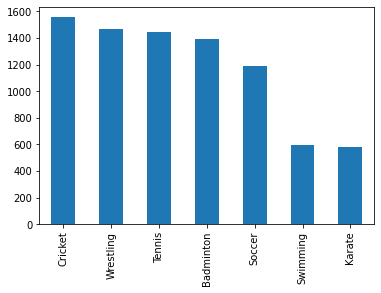

In [13]:
train_csv['label'].value_counts().plot(kind='bar')

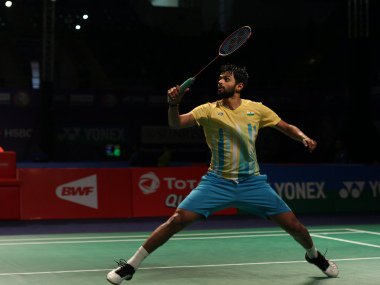

In [14]:
from IPython.display import Image
Image('drive/My Drive/Data/dataset/train/7c225f7b61.jpg')

Create the paths and their filenames

In [18]:
filenames = ['drive/My Drive/Data/dataset/train/' + fname for fname in train_csv['image_ID']]

In [16]:
#Check the number of filenames to the number of labels and the number of files
print('The number of filenames and labels are', 'same' if len(filenames) == len(train_csv['image_ID']) else 'not same')

import os
print ("The number of files in the folder and the number of filenames in the list are", 'same' if len(os.listdir('drive/My Drive/Data/dataset/train/')) == len(filenames) else 'not same')

The number of filenames and labels are same
The number of files in the folder and the number of filenames in the list are not same


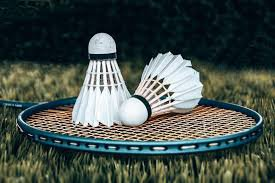

In [17]:
Image(filenames[100])

Turning data labels to numbers or tensors so that it is easier to process

In [14]:
import numpy as np
labels = np.array(train_csv['label'])
train_csv.isnull().any()

image_ID    False
label       False
dtype: bool

In [19]:
#check if the number of labels match number of filenames
print('The number of filenames and the number of labels are', 'same' if len(train_csv)==len(filenames) else 'not same')

The number of filenames and the number of labels are same


In [16]:
#Find the unique names of sports in question
unique_sports = np.unique(labels)
unique_sports

array(['Badminton', 'Cricket', 'Karate', 'Soccer', 'Swimming', 'Tennis',
       'Wrestling'], dtype=object)

In [24]:
#Compare each label to the unique sports and create a boolean array
boolean_labels = [label == unique_sports for label in labels]
boolean_labels[:5]

[array([ True, False, False, False, False, False, False]),
 array([ True, False, False, False, False, False, False]),
 array([ True, False, False, False, False, False, False]),
 array([ True, False, False, False, False, False, False]),
 array([False,  True, False, False, False, False, False])]

In [25]:
#Check if the labels match
print('Label:',labels[10])
print('Index of boolean label:',boolean_labels[10].argmax())
print('Position of label in unique_sports:',(np.where(labels[10]==unique_sports)))

Label: Cricket
Index of boolean label: 1
Position of label in unique_sports: (array([1]),)


In [26]:
#Define the X and y
X=filenames
y=boolean_labels

We are going to experiment with 1000 labels

In [27]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [28]:
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

Create a function to turn the image into tensors
1. Read the files
2. Store in to a variable
3. Convert to tensors
4. Resize the image
5. Return the modified image

In [26]:
#check with one image first
from matplotlib.pyplot import imread
image = imread(filenames[1])
image.shape

(172, 268, 4)

In [27]:
image.max(),image.min()

(255, 0)

In [28]:
tf.constant(image).shape

TensorShape([172, 268, 4])

In [8]:
#Define image size
IMG_SIZE = 224

def process_image(file_path):
  """
  This function reads image in to a variable that looks like string and then converts them into tensors and then later standardize the values and then resize them
  """
  # Read image to variable
  image =  tf.io.read_file(file_path)
  # Convert image to tensors
  tensor = tf.image.decode_jpeg(image,channels=3)
  # Standardize the image values
  normalised = tf.image.convert_image_dtype(tensor,tf.float32)
  # Resize the image
  image = tf.image.resize(normalised,size = [IMG_SIZE,IMG_SIZE])

  return (image)

According to tensorflow documentation, it is always a good thing to standardize your tensor values and split you data into batches. This is to handle the memory limitation of the GPUs. The minimum recommended batch size is 32. So we can write a function to do that

To use tensorflow effectively, we need our input data in the form of Tensor Tuples in the form (image,label)

In [9]:
# Define a function to form tensors and label tuple
def get_image_label(image_path,label):
  """
  Convert the image inputs to image and label tuples
  """
  return(process_image(image_path),label)


In [10]:
BATCH_SIZE = 32

def create_data_batches(X,y=[],batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates data batches. Also accepts data without labels. Shuffles the input data for better results
  """
  #if the dataset is test data, y will not be available
  if test_data:
    print ('Creating test data batches......')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    #Convert to tensors
    data_batch = data.map(process_image).batch(BATCH_SIZE)
  
  #If the data is validation data
  elif valid_data:
    print ('Creating validation data batches......')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    #Convert to tensor and get the label into the data as tuples
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

  #if the data is training data
  else:
    print("Creating training data batches........")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    #Schuffle the data
    data = data.shuffle(buffer_size = len(X))
    #Convert to tensors
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

  return data_batch

In [29]:
#Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data = True)

Creating training data batches........
Creating validation data batches......


In [33]:
#Properties of training and validation data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 7), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 7), dtype=tf.bool, name=None)))

For the sake of curiosity, the batched data can be unbatched and visualised as below

In [34]:
#Unbatch the images
train_images,train_labels = next(train_data.as_numpy_iterator()) #These images are actually in the form of numbers and labels 

In [35]:
# Set up a function to display just 25 images in the data
import matplotlib.pyplot as plt
def display_25_images(images,labels):
  # Set up the figure size
  plt.figure(figsize = (10,10))
  for i in range(25):
    # Define the axis subplot and set the shape to 5 X 5
    ax = plt.subplot(5,5,i+1)
    # Display the images
    plt.imshow(images[i])
    # Display the title (argmax of label array will give the position of the label in unique_sports)
    plt.title(unique_sports[labels[i].argmax()])
    # Set the axis off
    plt.axis('off')

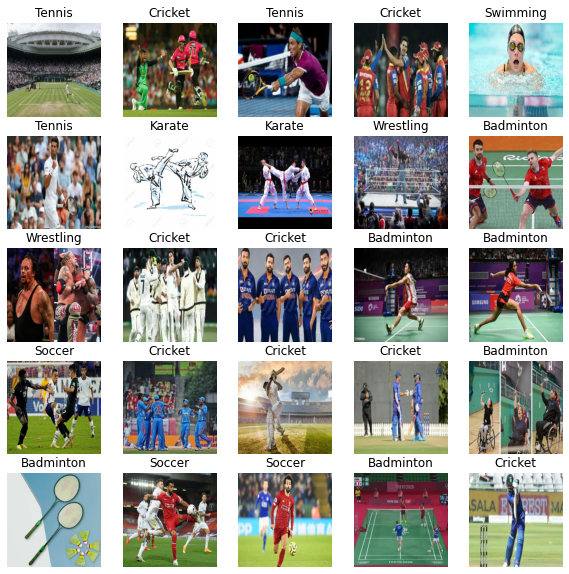

In [36]:
#View the images using the function
display_25_images(train_images,train_labels)

Observation: All the images are now square. Because we have resized these

Now that the data is prepped and ready to be used, we can build the model now. For model building 
1. Define the input shape
2. Define the output shape
3. Define the model URL

In [30]:
# Define the input shape,Image size=224, and 3 color channels
INPUT_SHAPE = (None,IMG_SIZE,IMG_SIZE,3)

# Define the output shape
OUTPUT_SHAPE = len(unique_sports)

# Define the model url
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

We are going to use the keras API. Define the function for the same
1. Define the keras layers
2. Compile the model
3. Build the model

In [31]:
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):

  # Define the model layers
  model = tf.keras.Sequential([
                       hub.KerasLayer(model_url),
                       tf.keras.layers.Dense(units = output_shape, activation = 'softmax')
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
      )
  
  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [39]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 7)                 7014      
                                                                 
Total params: 5,439,727
Trainable params: 7,014
Non-trainable params: 5,432,713
_________________________________________________________________


Create a callback

In [40]:
%load_ext tensorboard

In [32]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join('drive/My Drive/Data/dataset/logs/',datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return (tf.keras.callbacks.TensorBoard(logdir))

In [42]:
#create an early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience = 3)

Training the model:
Steps
1. Create a model
2. Create the call back
3. Create the early stopping call back
4. Train the model

In [33]:
NUM_EPOCHS = 100

def train_model():

  # Create the model, The inputs are already defined as default cases
  model = create_model()

  #Create the callback
  tensorboard_callback = create_tensorboard_callback()

  #Fit the model
  model.fit(x= train_data,
          epochs = NUM_EPOCHS,
          validation_data =val_data,
          validation_freq=1,
          callbacks=[tensorboard_callback,early_stopping])
  return (model)

In [45]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 156s 2s/step - loss: 1.4685 - accuracy: 0.4913 - val_loss: 0.8828 - val_accuracy: 0.6800
Epoch 2/100
25/25 [==============================] - 46s 2s/step - loss: 0.5355 - accuracy: 0.8112 - val_loss: 0.6482 - val_accuracy: 0.7700
Epoch 3/100
25/25 [==============================] - 44s 2s/step - loss: 0.3420 - accuracy: 0.8875 - val_loss: 0.5775 - val_accuracy: 0.7900
Epoch 4/100
25/25 [==============================] - 46s 2s/step - loss: 0.2504 - accuracy: 0.9262 - val_loss: 0.5425 - val_accuracy: 0.8100
Epoch 5/100
25/25 [==============================] - 46s 2s/step - loss: 0.1915 - accuracy: 0.9588 - val_loss: 0.5195 - val_accuracy: 0.8000
Epoch 6/100
25/25 [==============================] - 47s 2s/step - loss: 0.1545 - accuracy: 0.9625 - val_loss: 0.5103 - val_accuracy: 0.8300
Epoch 7/100
25/25 [==============================] - 60s 2s/step - loss: 0.1232 - accuracy: 0.9750 - val_loss: 0.4941 - val_accuracy: 0.8300
Epoch 8/100


In [46]:
#Checking the results on the tensorboard
%tensorboard --logdir drive/My\ Drive/Data/dataset/logs

Output hidden; open in https://colab.research.google.com to view.

Make predictions

In [47]:
y_preds = model.predict(val_data,verbose=1)

7/7 [==============================] - 63s 1s/step


In [48]:
y_preds.shape

(200, 7)

In [49]:
len(y_val)

200

In [50]:
index = 85
print ('probability of predictions: index',index,":",np.max(y_preds[index]))
print('Predicted label:',unique_sports[np.argmax(y_preds[index])])

probability of predictions: index 85 : 0.44768247
Predicted label: Tennis


In [34]:
# Define a function for turning the prediction probabilities in to a label
def get_pred_label(probabilities):
  return(unique_sports[np.argmax(probabilities)])

In [52]:
get_pred_label(y_preds[10])

'Badminton'

In [35]:
#Make a function to unbatch the data

def unbatch_data(data_batch):
  """
  Unbatch the data batch
  """
  images=[]
  labels=[]

  for image,label in data_batch.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_sports[np.argmax(label)])
  return (images,labels)

In [54]:
val_images,val_labels = unbatch_data(val_data)
val_images[0], val_labels[0]

(array([[[8.4682256e-01, 7.5272238e-01, 7.0565474e-01],
         [7.4797785e-01, 6.6170353e-01, 6.1072308e-01],
         [5.9452063e-01, 5.0844717e-01, 4.5741436e-01],
         ...,
         [2.0899913e-01, 7.9017915e-02, 2.0281984e-02],
         [9.4931744e-02, 4.4729668e-03, 1.3146254e-04],
         [1.5684441e-01, 7.4482597e-02, 5.4892357e-02]],
 
        [[8.3889204e-01, 7.4484420e-01, 6.9772416e-01],
         [7.4007356e-01, 6.5387785e-01, 6.0284489e-01],
         [5.8286071e-01, 5.0839525e-01, 4.5346671e-01],
         ...,
         [2.1672726e-01, 8.6745754e-02, 2.8010702e-02],
         [1.1859125e-01, 2.8054222e-02, 1.8441111e-04],
         [2.1213071e-01, 1.3359416e-01, 1.0611649e-01]],
 
        [[8.2324040e-01, 7.3696613e-01, 6.8206406e-01],
         [7.3210847e-01, 6.4604378e-01, 5.9107172e-01],
         [5.7498306e-01, 5.0069112e-01, 4.4178051e-01],
         ...,
         [2.2832252e-01, 9.8298997e-02, 3.9693978e-02],
         [1.6179693e-01, 5.9652261e-02, 8.2873122e-04],


Test out the different ways to visualise the results in a meaningful way
  1. Define a function to plot the images with the predicted and the truth labels
  2. Define a function to plot the probabilities of each label and highlight the truth label
  3. Combine the plots for better understandability

In [55]:
def plot_preds(images,labels,prediction,n=1):
  """
  Plots the predictions versus truth labels with the figure
  """
  image,label,predictions = images[n],labels[n],prediction[n]

  pred_label = get_pred_label(predictions)

  if (pred_label == label):
    color = 'green'
  else:
    color = 'red'

  
  plt.imshow(image)
  plt.title("Truth :{} / Preds :{} (Prob:{:0.3f})".format(label,pred_label,predictions[np.argmax(predictions)]),color = color)
  pass

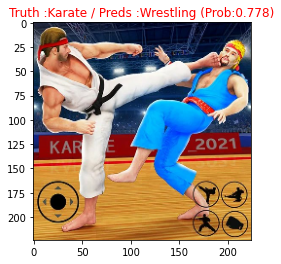

In [56]:
plot_preds(val_images,val_labels,y_preds)

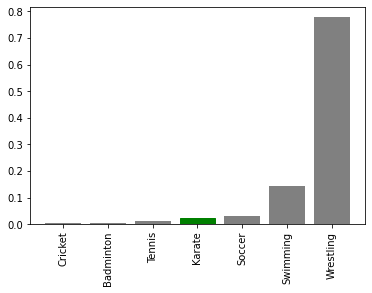

In [57]:
def plot_pred_probs(labels,prediction,n=1):

  """
  Plots the prediction probabilities of different labels with the truth label highlighted as green
  """
  label,predictions = labels[n],prediction[n]
 
  # Get the truth label
  truth_label = label

  # Get the predicted indices in ascending order
  indices_in_asc_order = np.argsort(predictions)

  # Get the predicted labels
  pred_labels = unique_sports[indices_in_asc_order]

  # Get the prediction probabilities in ascending order
  prediction_probabilities = predictions[indices_in_asc_order]

  # Define the bar plot
  plot_bar = plt.bar(pred_labels,prediction_probabilities,color='grey')

  # Keep the ticks vertical for better readability
  plt.xticks(rotation = 'vertical')

  # Set the color of truth label as green
  plot_bar[np.argmax(pred_labels == truth_label)].set_color("green") 

#Test the function
plot_pred_probs(val_labels ,y_preds)

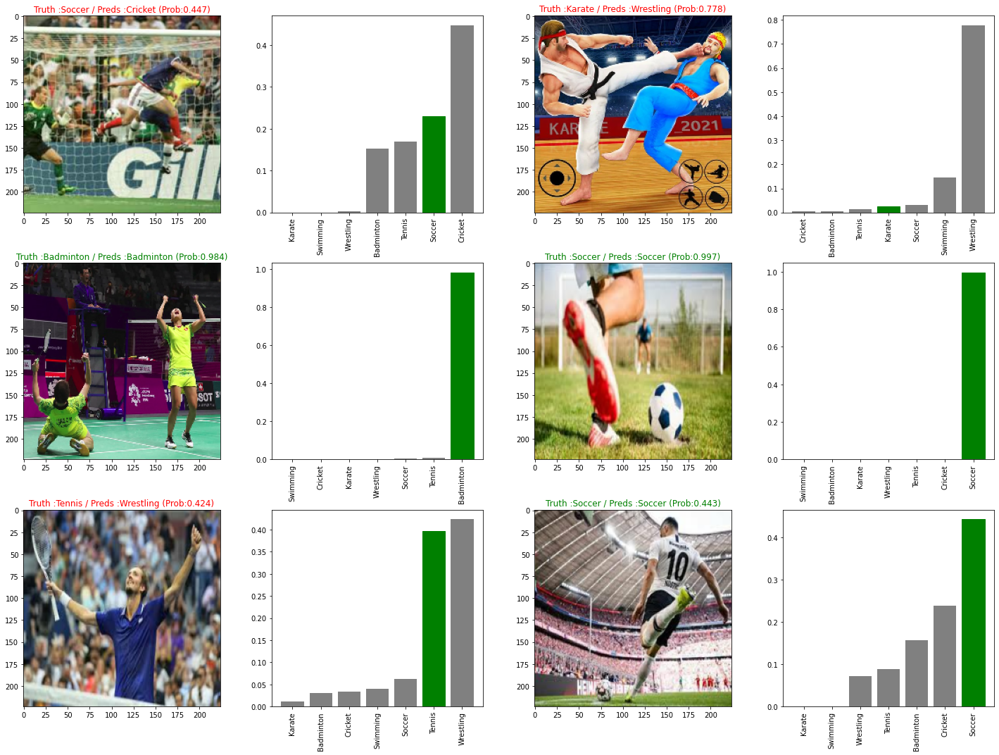

In [58]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_preds(prediction = y_preds,
            labels = val_labels,
            images = val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_probs(prediction = y_preds,
                labels = val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [36]:
def save_model(model,suffix = None):
  """
  Save the model to the specified directory in h5 format
  """
  # Create a model directory with date and time strings
  model_dir = os.path.join("drive/My Drive/Data/dataset/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

  # Create a model path
  model_path = model_dir+"-"+suffix+'.h5'

  print(f"Saving model to :{model_path}")
  model.save(model_path)
  
  return (model_path)

In [60]:
save_model(model,"1000_images")

Saving model to :drive/My Drive/Data/dataset/models/20220315-14331647354804-1000_images.h5


'drive/My Drive/Data/dataset/models/20220315-14331647354804-1000_images.h5'

In [37]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Training the model on the entire dataset

In [62]:
load_model("drive/My Drive/Data/dataset/models/20220315-10481647341287-1000_images.h5")

Loading saved model from: drive/My Drive/Data/dataset/models/20220315-10481647341287-1000_images.h5


In [63]:
len(X),len(y)

(8227, 8227)

Prepare the model for training on full dataset
Steps
1. Create data batches for full dataset using the function defined previously
2. Define the model
3. Define the callbacks
4. Use the fit function to fit hte model

In [38]:
full_data = create_data_batches(X,y)

Creating training data batches........


In [39]:
full_model = create_model()

In [40]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience = 3)

In [41]:
full_model.fit(x=full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard,full_model_early_stopping])

Epoch 1/100


KeyboardInterrupt: ignored

In [68]:
#Save the full model
save_model(full_model,"full_model")

Saving model to :drive/My Drive/Data/dataset/models/20220315-20391647376789-full_model.h5


'drive/My Drive/Data/dataset/models/20220315-20391647376789-full_model.h5'

In [42]:
#Load the full model 
full_model = load_model("drive/My Drive/Data/dataset/models/20220315-20391647376789-full_model.h5")

Loading saved model from: drive/My Drive/Data/dataset/models/20220315-20391647376789-full_model.h5


Making Predictions on the test data set
1. Get a list of the image filenames
2. Convert the test data to data batches. Remember to turn the test_data parameter to True
3. Make predictions 

In [43]:
import os
test_data_path = "drive/My Drive/Data/dataset/test/"
test_filenames = [test_data_path + fname for fname in os.listdir("drive/My Drive/Data/dataset/test")] 

In [44]:
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches......


In [45]:
test_preds = full_model.predict(test_data,verbose=1)

65/65 [==============================] - 119s 2s/step


In [40]:
#Save it to csv
np.savetxt("drive/My Drive/Data/dataset/preds_array.csv",test_preds, delimiter = ",")

In [41]:
#read it from csv
test_preds = np.loadtxt("drive/My Drive/Data/dataset/preds_array.csv", delimiter = ",")

In [47]:
#Save the file with column names to csv
test_preds.to_csv("drive/My Drive/Data/dataset/preds_file.csv")

In [48]:
#Check the test shape
test_preds.shape,

((2056, 7),)

In [55]:
# Prepare the submission file
id = []
[id.append(fname.split('.')[0]) for fname in os.listdir("drive/My Drive/Data/dataset/test")]
id[:5]

['fb35eae95d', 'b59db761f6', '2fcc498682', 'f5dd3404a8', '01c67f4e37']

In [59]:
#Get the column labels
test_preds = pd.DataFrame(test_preds,columns = unique_sports)

In [60]:
test_preds['Image_ID'] = id
test_preds.head()

,Badminton,Cricket,Karate,Soccer,Swimming,Tennis,Wrestling,Image_ID
0,3.740149e-16,1.000000e+00,1.887032e-16,4.744737e-10,5.986424e-21,4.524441e-09,3.830205e-15,fb35eae95d
1,6.032401e-10,1.538170e-09,2.450300e-11,9.998957e-01,8.141058e-12,7.925787e-09,1.042808e-04,b59db761f6
2,9.336424e-21,9.970228e-01,1.900352e-12,2.977164e-03,8.789347e-21,1.581900e-09,4.758739e-17,2fcc498682
3,3.201774e-09,6.550319e-09,4.427590e-12,9.999999e-01,2.612050e-17,1.096088e-07,8.558374e-10,f5dd3404a8
4,2.456896e-07,5.686369e-07,3.446870e-10,4.687611e-11,1.791178e-15,9.999992e-01,2.077928e-09,01c67f4e37


In [65]:
test_preds[[ 'Image_ID','Badminton', 'Cricket', 'Karate', 'Soccer', 'Swimming', 'Tennis',
       'Wrestling']].to_csv("drive/My Drive/Data/dataset/kaggle_output.csv",index=False)